<a href="https://colab.research.google.com/github/NickCKH/Projects/blob/master/Flowers_Adversarial_Network_v3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [88]:
# set tf 1.x for colab
%tensorflow_version 1.x

import setup_google_colab
import os
import subprocess
import json
import time
import requests
import sys
sys.path.append("..")

import tqdm_utils
from google.colab import drive

###Foreword 
I've had no choice but to sign up for a Google Colab premium membership to make use of their Tesla P100 GPU, which is ridiculously cheap considering its USD10+ per month

In [ ]:
#Check GPU memory footprint support libraries/code
!ln -sf /opt/bin/nvidia-smi /usr/bin/nvidia-smi
!pip install gputil
!pip install psutil
!pip install humanize
import psutil
import humanize
import os
import GPUtil as GPU
GPUs = GPU.getGPUs()

gpu = GPUs[0]
def printm():
 process = psutil.Process(os.getpid())
 print("Gen RAM Free: " + humanize.naturalsize( psutil.virtual_memory().available ), " | Proc size: " + humanize.naturalsize( process.memory_info().rss))
 print("GPU RAM Free: {0:.0f}MB | Used: {1:.0f}MB | Util {2:3.0f}% | Total {3:.0f}MB".format(gpu.memoryFree, gpu.memoryUsed, gpu.memoryUtil*100, gpu.memoryTotal))
printm() 

gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Gen RAM Free: 10.8 GB  | Proc size: 3.5 GB
GPU RAM Free: 11635MB | Used: 4645MB | Util  29% | Total 16280MB
Mon May 18 02:48:53 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 418.67       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   58C    P0    34W / 250W |   4645MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
(500, 625, 3)


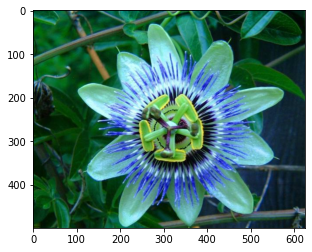

(62, 62, 3)


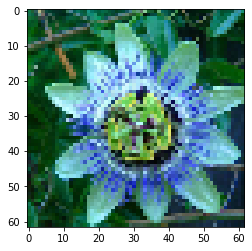

In [67]:
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
plt.rcParams.update({'axes.titlesize': 'small'})
from keras import backend as K
from sklearn.datasets import load_digits
import scipy.io
from sklearn.model_selection import train_test_split
import cv2
import tarfile

import tensorflow as tf
from tensorflow.nn import log_softmax as log_soft
from keras_utils import reset_tf_session
s = reset_tf_session()
import keras
from keras.models import Sequential
from keras import layers as L
from keras.layers.advanced_activations import LeakyReLU

drive.mount('/content/gdrive')


# data = np.float32(data)/255.

# Crop and resize input images to IMG_SIZE x IMG_SIZE
IMG_SIZE = 62

def decode_image_from_raw_bytes(raw_bytes):
    img = cv2.imdecode(np.asarray(bytearray(raw_bytes), dtype=np.uint8), 1)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img



def image_center_crop(img):
    """
    Makes a square center crop of an img, which is a [h, w, 3] numpy array.
    Returns [min(h, w), min(h, w), 3] output with same width and height.
    For cropping use numpy slicing.
    """
    h, w, _ = img.shape
    a = min(h, w)

    cropped_img = img[(h-a)//2:h-(h-a)//2,(w-a)//2:w-(w-a)//2,:]
    
    return cropped_img

def prepare_raw_bytes_for_model(raw_bytes, normalize_for_model=True):
    img = decode_image_from_raw_bytes(raw_bytes)  # decode image raw bytes to matrix
    img = image_center_crop(img)  # take squared center crop
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))  # resize for our model
    if normalize_for_model:
        img = img.astype("float32")  # prepare for normalization
        img = keras.applications.inception_v3.preprocess_input(img)  # normalize for model
    return img

def read_raw_from_tar(tar_fn, fn):
    with tarfile.open(tar_fn) as f:
        m = f.getmember(fn)
        return f.extractfile(m).read()

def read_raw_from_folder(folder, fn):
  directory = "/content/gdrive/My Drive/Flower_GAN3_tar/"
  path = os.path.join(directory, fn)
  with open(path, "rb") as f:

    return f.read()

  
# test cropping
# raw_bytes = read_raw_from_tar("102flowers.tgz", "jpg/image_00002.jpg")
raw_bytes = read_raw_from_folder(directory, "jpg/image_00002.jpg")

img = decode_image_from_raw_bytes(raw_bytes)
print(img.shape)
plt.imshow(img)
plt.show()

img = prepare_raw_bytes_for_model(raw_bytes, normalize_for_model=False)
print(img.shape)
plt.imshow(img)
plt.show()

In [81]:
# read filenames directly from folder
def get_all_filenames(folder):

    return [m for m in os.listdir(folder)]

all_files = sorted(get_all_filenames("/content/gdrive/My Drive/Flower_GAN3_tar/jpg/"))  # list all files in tar sorted by name



def batch_generator(items, batch_size):
    """
    Function to yield image in batches for model training
    """
    count = 0
    output = []
    for item in items:
        output.append(item)
        count += 1
        if count == batch_size:
            yield output
            output = []
            count = 0
    yield output


In [85]:
#Yield the images in a list
def preprocess(folder, files):
    imgs = []

    for f in files: 

      raw = read_raw_from_folder(folder, "jpg/image_00002.jpg")
      img = prepare_raw_bytes_for_model(raw)
      imgs.append(img)

    # imgs = np.stack(imgs, axis = 0)
    return imgs

imgs = preprocess("/content/gdrive/My Drive/Flower_GAN3_tar/", all_files)
imgs = np.stack(imgs, axis = 0)

In [86]:
imgs.shape


(8189, 62, 62, 3)

###Modelling
Now lets get to the model, we'll need a Generator and a Discriminator to train each other, I've tried 2 versions of this already and find that a deeper network with batch normalization to reduce the number of parameters seemed to work best given my lack of computational resources.

In [ ]:
CODE_SIZE = 256
from keras import backend as K
K.set_learning_phase(1)

# generator = Sequential()
# generator.add(L.InputLayer([CODE_SIZE],name='noise'))
# generator.add(L.Dense(10*14*14, activation='elu'))
# generator.add(L.Reshape((14,14,10)))

# generator.add(L.Deconv2D(256,kernel_size=(5,5),activation='elu'))
# generator.add(L.Deconv2D(256,kernel_size=(5,5),activation='elu'))
# generator.add(L.Deconv2D(256,kernel_size=(5,5),activation='elu'))
# generator.add(L.UpSampling2D(size=(2,2)))

# generator.add(L.Deconv2D(128,kernel_size=(5,5),activation='elu'))
# generator.add(L.Deconv2D(128,kernel_size=(5,5),activation='elu'))
# generator.add(L.Deconv2D(128,kernel_size=(5,5),activation='elu'))
# generator.add(L.UpSampling2D(size=(2,2)))

# generator.add(L.Deconv2D(64,kernel_size=3,activation='elu'))
# generator.add(L.Deconv2D(64,kernel_size=3,activation='elu'))
# generator.add(L.Deconv2D(64,kernel_size=3,activation='elu'))

# generator.add(L.Conv2D(3,kernel_size=3,activation=None))




generator = Sequential()
generator.add(L.InputLayer([CODE_SIZE],name='noise'))
generator.add(L.Dense(4*4*512, activation='relu'))
generator.add(L.Reshape((4,4,512)))

generator.add(L.Deconvolution2D(512,kernel_size=(3,3),activation='relu'))
generator.add(L.BatchNormalization())
generator.add(L.UpSampling2D(size=(2,2)))

generator.add(L.Deconvolution2D(256,kernel_size=(3,3),activation='relu'))
generator.add(L.BatchNormalization())
generator.add(L.UpSampling2D(size=(2,2)))

generator.add(L.Deconvolution2D(128,kernel_size=(3,3),activation='relu'))
generator.add(L.BatchNormalization())
generator.add(L.UpSampling2D(size=(2,2)))

generator.add(L.Deconvolution2D(64,kernel_size=(3,3),activation='relu'))
generator.add(L.BatchNormalization())

generator.add(L.Conv2D(3,kernel_size=1,activation=None))



# generator = Sequential()
# generator.add(L.InputLayer([CODE_SIZE],name='noise'))
# generator.add(L.Dense(10*8*8, activation='elu'))

# generator.add(L.Reshape((8,8,10)))
# generator.add(L.Deconv2D(64,kernel_size=(5,5),activation='elu'))
# generator.add(L.Deconv2D(64,kernel_size=(5,5),activation='elu'))
# generator.add(L.UpSampling2D(size=(2,2)))
# generator.add(L.Deconv2D(32,kernel_size=3,activation='elu'))
# generator.add(L.Deconv2D(32,kernel_size=3,activation='elu'))
# generator.add(L.Deconv2D(32,kernel_size=3,activation='elu'))

# generator.add(L.Conv2D(3,kernel_size=3,activation=None))
# generator.output_shape[1:]

print(generator.output_shape[1:])
generator.summary()

(62, 62, 3)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
noise (InputLayer)           (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 8192)              2105344   
_________________________________________________________________
reshape_1 (Reshape)          (None, 4, 4, 512)         0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 6, 6, 512)         2359808   
_________________________________________________________________
batch_normalization_1 (Batch (None, 6, 6, 512)         2048      
_________________________________________________________________
up_sampling2d_1 (UpSampling2 (None, 12, 12, 512)       0         
_________________________________________________________________
conv2d_transpose_2 (Conv2DTr (None, 14, 14, 256)       1179904  

In [ ]:
assert generator.output_shape[1:] == img.shape, "generator must output an image of shape %s, but instead it produces %s"%(IMG_SHAPE,generator.output_shape[1:])

In [ ]:
# discriminator.add(L.InputLayer(img.shape))
# #Image Shape = (130,130, 32)
# discriminator.add(L.Conv2D(filters = 32, kernel_size = (3,3), strides = 1))
# discriminator.add(L.LeakyReLU(0.1))
# discriminator.add(L.Conv2D(filters = 64, kernel_size = (3,3), strides = 1))
# discriminator.add(L.LeakyReLU(0.1))
# #Image Shape = (128,128, 64)
# discriminator.add(L.MaxPooling2D(pool_size=(2, 2), strides=None, data_format=None))
# #Image Shape = (64,64, 64)
# discriminator.add(L.Conv2D(filters = 80, kernel_size = (3,3), strides = 1))
# discriminator.add(L.LeakyReLU(0.1))
# #Image Shape = (62,62, 128)
# discriminator.add(L.MaxPooling2D(pool_size=(2, 2), strides=None, data_format=None))
# #Image Shape = (31,31, 128)
# discriminator.add(L.Flatten())
# discriminator.add(L.Dense(256,activation='tanh'))
# discriminator.add(L.Dense(2,activation=tf.nn.log_softmax))

discriminator = Sequential()
discriminator.add(L.InputLayer(img.shape))
discriminator.add(L.Conv2D(filters = 64, kernel_size = (3,3), strides = 1))
discriminator.add(L.BatchNormalization())
discriminator.add(L.LeakyReLU(0.1))
discriminator.add(L.MaxPooling2D(pool_size=(2, 2), strides=None, data_format=None))

discriminator.add(L.Conv2D(filters = 128, kernel_size = (3,3), strides = 1))
discriminator.add(L.BatchNormalization())
discriminator.add(L.LeakyReLU(0.1))
discriminator.add(L.MaxPooling2D(pool_size=(2, 2), strides=None, data_format=None))

discriminator.add(L.Conv2D(filters = 256, kernel_size = (3,3), strides = 1))
discriminator.add(L.BatchNormalization())
discriminator.add(L.LeakyReLU(0.1))
discriminator.add(L.MaxPooling2D(pool_size=(2, 2), strides=None, data_format=None))

discriminator.add(L.Conv2D(filters = 512, kernel_size = (3,3), strides = 1))
discriminator.add(L.BatchNormalization())
discriminator.add(L.LeakyReLU(0.1))
discriminator.add(L.MaxPooling2D(pool_size=(2, 2), strides=None, data_format=None))

discriminator.add(L.Flatten())
discriminator.add(L.Dense(256,activation='tanh'))
discriminator.add(L.Dense(2,activation=tf.nn.log_softmax))

# #Image Shape = (36,36, 3)
# discriminator.add(L.Conv2D(filters = 16, kernel_size = (3,3), strides = 1))
# #Image Shape = (34,34, 16)
# discriminator.add(L.LeakyReLU(0.1))
# discriminator.add(L.Conv2D(filters = 32, kernel_size = (3,3), strides = 1))
# #Image Shape = (32,32, 32)
# discriminator.add(L.LeakyReLU(0.1))
# discriminator.add(L.MaxPooling2D(pool_size=(2, 2), strides=None, data_format=None))
# #Image Shape = (16,16, 32)
# discriminator.add(L.Conv2D(filters = 32, kernel_size = (3,3), strides = 1))
# #Image Shape = (14,14, 32)
# discriminator.add(L.LeakyReLU(0.1))
# discriminator.add(L.Conv2D(filters = 64, kernel_size = (3,3), strides = 1))
# #Image Shape = (12,12, 64)
# discriminator.add(L.LeakyReLU(0.1))
# discriminator.add(L.MaxPooling2D(pool_size=(2, 2), strides=None, data_format=None))
# #Image Shape = (6,6, 64)
# discriminator.add(L.Flatten())
# #Image Shape = (2304,)
# discriminator.add(L.Dense(256,activation='tanh'))
# #Image Shape = (256,)
# discriminator.add(L.Dense(2,activation=tf.nn.log_softmax))

print(discriminator.output_shape[1:])
discriminator.summary()

(2,)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 62, 62, 3)         0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 60, 60, 64)        1792      
_________________________________________________________________
batch_normalization_5 (Batch (None, 60, 60, 64)        256       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 60, 60, 64)        0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 30, 30, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 28, 28, 128)       73856     
_________________________________________________________________
batch_normalization_6 (Batch (None, 28, 28, 128)       512       
_____

In [ ]:
"""
Create placeholders for Gaussian noise input for the Generator, 
and image input for the Discriminator
"""
CODE_SIZE = 256
noise = tf.placeholder('float32',[None,CODE_SIZE])
real_data = tf.placeholder('float32',[None,]+list(img.shape))

logp_real = discriminator(real_data)

generated_data = generator(noise)

logp_gen = discriminator(generated_data)


In [ ]:
"""
Discriminator training
"""

d_loss = -tf.reduce_mean(logp_real[:,1] + logp_gen[:,0])

#regularize
d_loss += tf.reduce_mean(discriminator.layers[-1].kernel**2) #This is L2 regularization of the weights

#optimize
disc_optimizer =  tf.train.AdamOptimizer(1e-4).minimize(d_loss,var_list=discriminator.trainable_weights)

In [ ]:
"""
Generator training
"""

g_loss = -tf.reduce_mean(logp_gen[:,1])

gen_optimizer = tf.train.AdamOptimizer(1e-4).minimize(g_loss,var_list=generator.trainable_weights)
s.run(tf.global_variables_initializer())
    

In [ ]:
from keras.models import load_model

# s = reset_tf_session()
from keras import backend as K
K.set_learning_phase(1)
# get_custom_objects().update({'activation': })
# # last_gen_epoch = 4
# # last_dis_epoch = 4
gen_name = f'/content/gdrive/My Drive/Flower_GAN3_models/Flower_gen.v5.29900.hdf5'
dis_name = f'/content/gdrive/My Drive/Flower_GAN3_models/Flower_dis.v5.29900.hdf5'
# generator = load_model(gen_name)
# discriminator = load_model(dis_name,custom_objects = {"log_softmax": log_soft})
generator.load_weights(gen_name)
discriminator.load_weights(dis_name)


Helper functions that draw current data distributions and sample training batches,
I've also saved files to my Google Drive for presentation at the end


In [ ]:
def sample_noise_batch(bsize):
    return np.random.normal(size=(bsize, CODE_SIZE)).astype('float32')

def sample_data_batch(bsize):
    idxs = np.random.choice(np.arange(imgs.shape[0]), size=bsize)
    return imgs[idxs]

def sample_images(nrow,ncol, ver, epoch, sharp=False):
    images = generator.predict(sample_noise_batch(bsize=nrow*ncol))
    if np.var(images)!=0:
        images = images.clip(np.min(imgs),np.max(imgs))
    for i in range(nrow*ncol):
        plt.subplot(nrow,ncol,i+1)
        if sharp:
            plt.imshow(images[i].reshape(img.shape),cmap="gray", interpolation="none")
        else:
            plt.imshow(images[i].reshape(img.shape),cmap="gray")
    plt.savefig(f'/content/gdrive/My Drive/Flower_GAN3/Flower_GAN_plot_v{ver}_{epoch}.png')
    plt.show()


def sample_probas(bsize):
    plt.title('Generated vs real data')
    plt.hist(np.exp(discriminator.predict(sample_data_batch(bsize)))[:,1],
             label='D(x)', alpha=0.5,range=[0,1])
    plt.hist(np.exp(discriminator.predict(generator.predict(sample_noise_batch(bsize))))[:,1],
             label='D(G(z))',alpha=0.5,range=[0,1])
    plt.legend(loc='best')
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


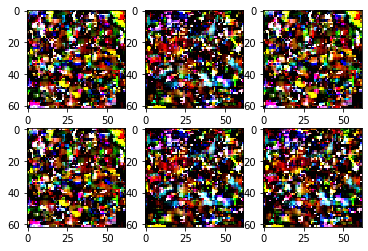

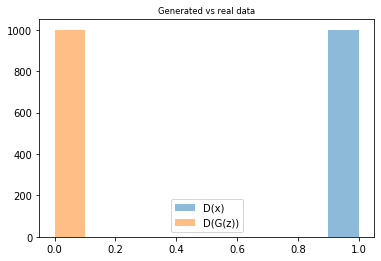

Currently at epoch... 6500


KeyboardInterrupt: ignored

In [ ]:
from IPython import display
ver = 6
for epoch in tqdm_utils.tqdm_notebook_failsafe(range(30000)):
    
    feed_dict = {
        real_data:sample_data_batch(100),
        noise:sample_noise_batch(100)
    }
    
    for i in range(5):

        s.run(disc_optimizer,feed_dict)
  
    s.run(gen_optimizer,feed_dict)
    
    if epoch %100==0:
        display.clear_output(wait=True)
        sample_images(2,3, ver,epoch,
                      True)
        sample_probas(1000)
        gen_name = f'Flower_gen.v{ver}.{epoch}.hdf5'
        dis_name = f'Flower_dis.v{ver}.{epoch}.hdf5'
        generator.save(f'/content/gdrive/My Drive/Flower_GAN3_models/{gen_name}')
        discriminator.save(f'/content/gdrive/My Drive/Flower_GAN3_models/{dis_name}')   
        print(f'Currently at epoch... {epoch}')


    # if epoch %1 == 0:
    # 
    # sys.stdout.flush()
    

The network was trained for about 15k iterations before an issue occurred with a vanished gradient which you can see in the 6 images from the cell above (Just explosion of colors). Good thing I constantly saved discriminator and generator progress along the way, I ended up having to restart the training another 2 times to get to nice generated flower images, I've output the entire timeline of images below, the results are amazing!



Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


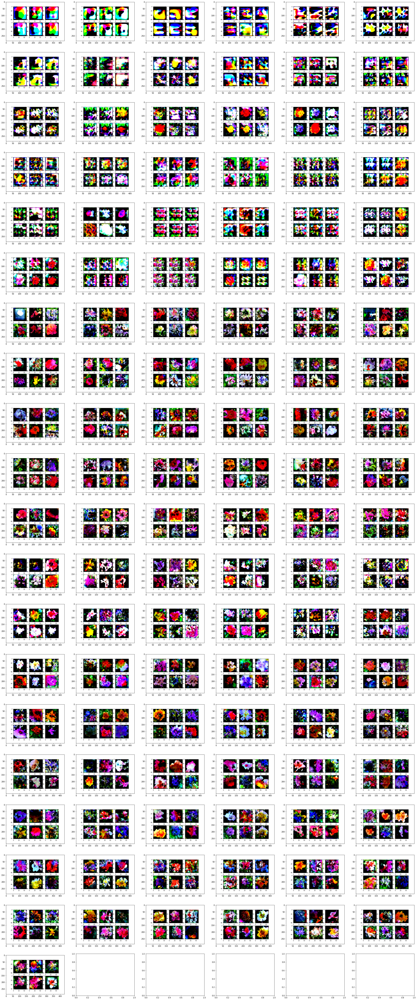

In [60]:
%matplotlib inline
import os
import matplotlib.image as mpimg
drive.mount('/content/gdrive')
directory = "/content/gdrive/My Drive/Flower_GAN3_select/"
os.chdir(directory)

fig,ax =plt.subplots(int(round(len(os.listdir())/6,0))+1, 6, figsize = (40, 100))

row = 0
col = 0
for i in range(0, len(os.listdir())):
  img = mpimg.imread(os.path.join(directory,sorted(os.listdir())[i]))
  ax[row, col].imshow(img)
  if col == 5:
    col = 0
    row+=1
  else: 
    col+=1
plt.show()


###Conclusion:
I'd like to remind the viewer that it is truly amazing that NONE of those images in the cell above are real, and are completely generated through feeding Gaussian noise through a neural network. 
May revisit this next time when I have a GPU better than a Tesla P100 :D